# ONLINE STREAMING PLATFORMS🎥🎬📽🎞

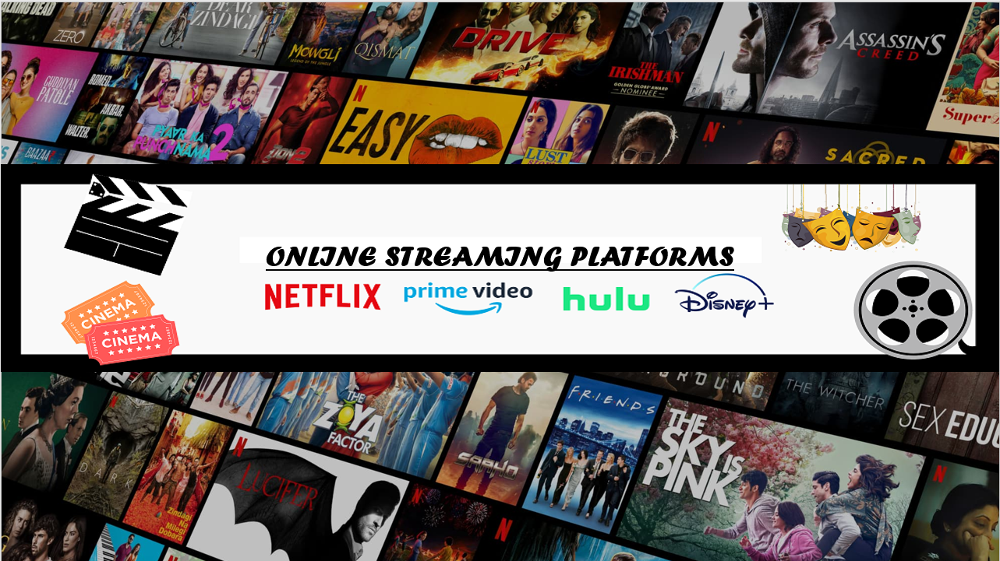

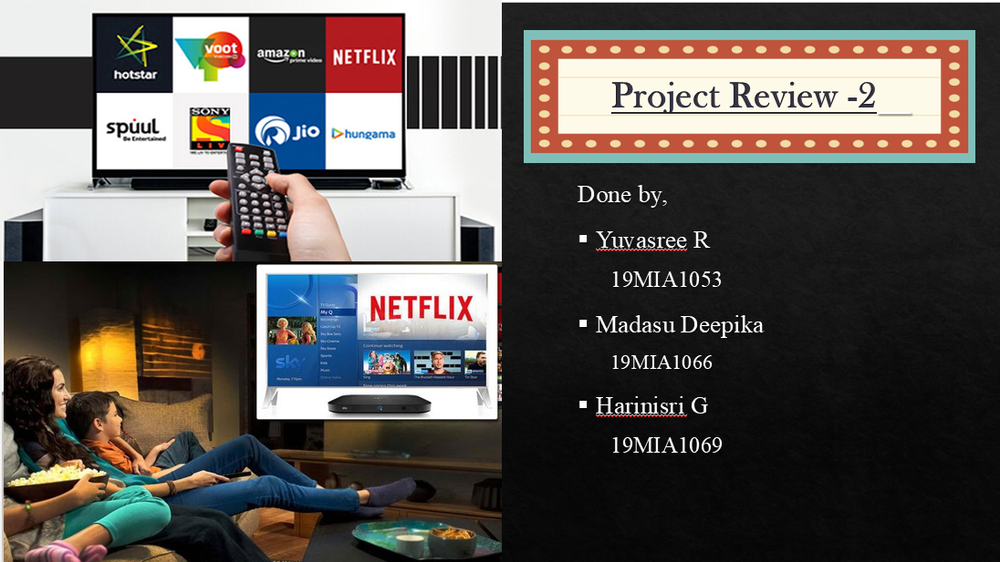

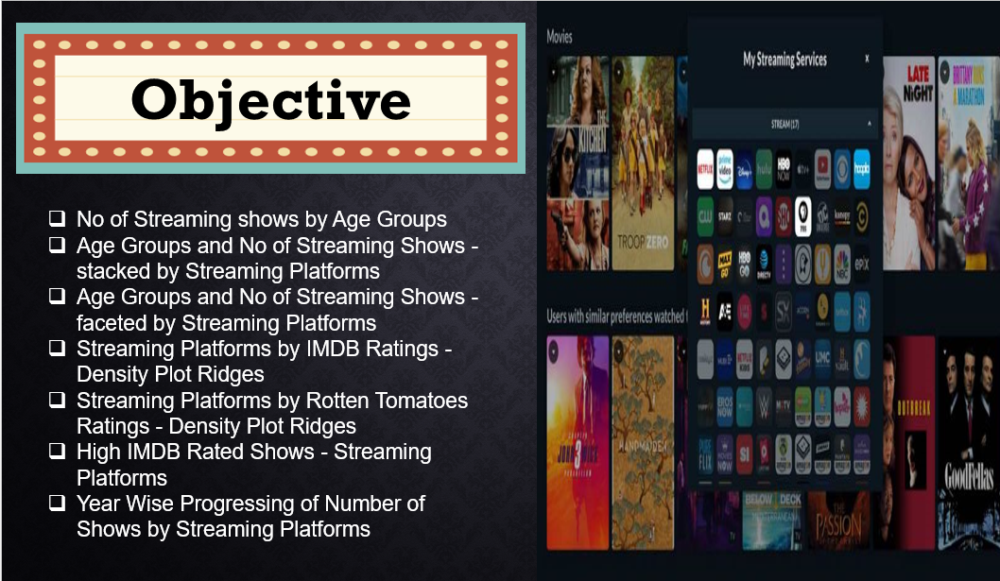

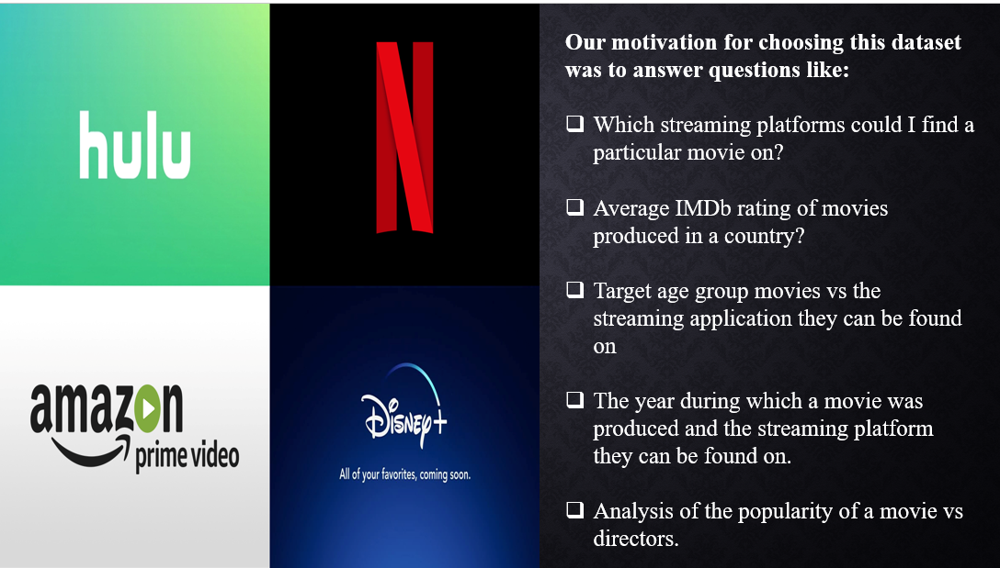

In [14]:
import pandas as pd
import numpy as np

In [15]:
#IMPORTING THE DATASET
tvshows_df = pd.read_csv('tv_shows.csv')
tvshows_df

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,9.5,96%,1,0,0,0,1
1,1,Stranger Things,2016,16+,8.8,93%,1,0,0,0,1
2,2,Money Heist,2017,18+,8.4,91%,1,0,0,0,1
3,3,Sherlock,2010,16+,9.1,78%,1,0,0,0,1
4,4,Better Call Saul,2015,18+,8.7,97%,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
5606,5606,Tut's Treasures: Hidden Secrets,2018,NaN,NaN,NaN,0,0,0,1,1
5607,5607,Paradise Islands,2017,NaN,NaN,NaN,0,0,0,1,1
5608,5608,Wild Russia,2018,NaN,NaN,NaN,0,0,0,1,1
5609,5609,Love & Vets,2017,NaN,NaN,NaN,0,0,0,1,1


In [16]:
tvshows_df.shape

(5611, 11)

# DATA CLEANING

In [17]:
new_df=tvshows_df[tvshows_df.IMDb.notna()]
new_df=new_df[new_df.Age.notna()]
new_df=new_df[new_df['Rotten Tomatoes'].notna()]
new_df.reset_index(inplace=True)
new_df=new_df.drop(columns=['index','Unnamed: 0','type'])

In [18]:
#converting numerical column to Decipherable type
IMDb_rating=np.array(list(new_df.IMDb))
RT_rating=np.array(np.char.strip(np.array(list(new_df["Rotten Tomatoes"])),'%'),dtype='float64')
new_df['Rotten Tomatoes']=RT_rating
#cleaned data frame
new_df

,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
0,Breaking Bad,2008,18+,9.5,96.0,1,0,0,0
1,Stranger Things,2016,16+,8.8,93.0,1,0,0,0
2,Money Heist,2017,18+,8.4,91.0,1,0,0,0
3,Sherlock,2010,16+,9.1,78.0,1,0,0,0
4,Better Call Saul,2015,18+,8.7,97.0,1,0,0,0
...,...,...,...,...,...,...,...,...,...
926,Diary of a Future President,2020,7+,5.5,100.0,0,0,0,1
927,Encore!,2019,7+,7.4,68.0,0,0,0,1
928,Spider-Man Unlimited,1999,7+,6.5,50.0,0,0,0,1
929,The Super Hero Squad Show,2009,7+,6.1,50.0,0,0,0,1


# HISTOGRAM

In [19]:
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 15
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

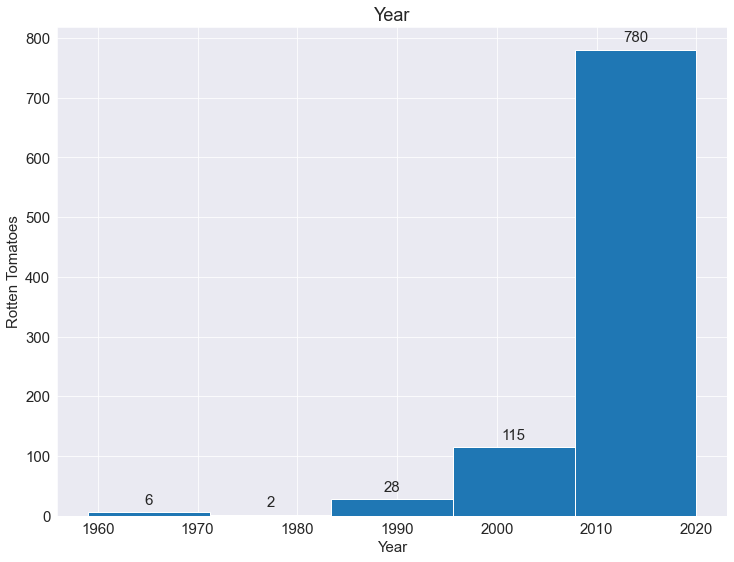

In [20]:
fig, ax = plt.subplots(figsize=(12,9))
ax.hist(new_df.Year,bins=5, density=False)
plt.xlabel("Year")
plt.ylabel("Rotten Tomatoes")
plt.title("Year")
for rect in ax.patches:
    height = rect.get_height()
    ax.annotate(f'{int(height)}', xy=(rect.get_x()+rect.get_width()/2, height),xytext=(0, 5), textcoords='offset points', ha='center', va='bottom') 
plt.show()

In [21]:
new_df.describe()

,Year,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
count,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000,931.000000
mean,2013.093448,7.534801,77.823845,0.446831,0.375940,0.227712,0.024705
std,7.606510,0.952062,20.369783,0.497432,0.484625,0.419581,0.155307
min,1959.000000,1.700000,6.000000,0.000000,0.000000,0.000000,0.000000
25%,2011.000000,7.100000,67.000000,0.000000,0.000000,0.000000,0.000000
50%,2015.000000,7.700000,84.000000,0.000000,0.000000,0.000000,0.000000
75%,2018.000000,8.200000,93.000000,1.000000,1.000000,0.000000,0.000000
max,2020.000000,9.500000,100.000000,1.000000,1.000000,1.000000,1.000000


# BOXPLOT

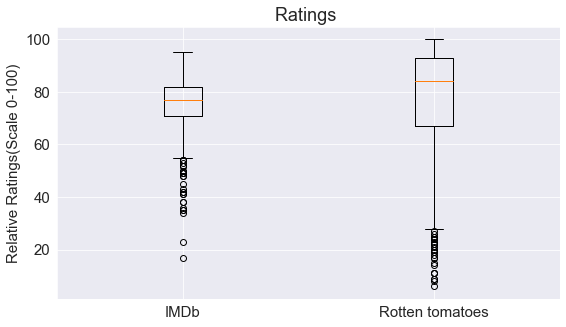

In [22]:
#rating comparison using the boxplot
fig,ax = plt.subplots()
bp_data=[IMDb_rating*10,RT_rating]
ax.boxplot(bp_data)
ax.set_xticklabels(["IMDb","Rotten tomatoes"])
plt.ylabel("Relative Ratings(Scale 0-100)")
plt.title("Ratings ")
plt.show()

# PIE CHART

([<matplotlib.patches.Wedge at 0x1909e134648>,
 [Text(0.288311852523778, 1.0615442881454864, 'Netflix'),
  Text(-0.9272407745521478, -0.5917977238955326, 'Hulu'),
  Text(0.7586703888902204, -0.7965043885762098, 'Prime Video'),
  Text(1.097135416493267, -0.07933396420289178, 'Disney+')])

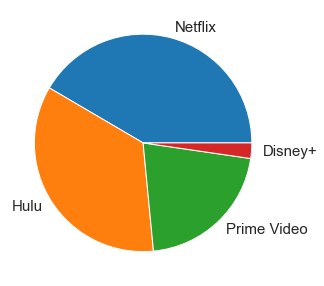

In [23]:
N = new_df['Netflix']
N.head()
Sum= N.sum()
H = new_df['Hulu']
H.head()
Hulu_total= H.sum()
P = new_df['Prime Video']
P.head()
Prime_total= P.sum()
D= new_df['Disney+']
D.head()
Disney_total= D.sum()
show_number =[416,350,212,23]
subs = [('Netflix'),('Hulu'),('Prime Video'),('Disney+')]
plt.pie(show_number,labels=subs)

#  z-score and normalisation

In [24]:
def z_score(df):
    df_std = df.copy()
    for column in df_std.columns:
        df_std[column] = (df_std[column] - df_std[column].mean()) / df_std[column].std()
    return df_std

In [25]:
new_df_numeric = new_df[["Year","IMDb","Rotten Tomatoes"]]
df_normalized = z_score(new_df_numeric)
df_normalized

,Year,IMDb,Rotten Tomatoes
0,-0.669617,2.064150,0.892310
1,0.382114,1.328904,0.745033
2,0.513580,0.908763,0.646848
3,-0.406684,1.644009,0.008648
4,0.250647,1.223869,0.941402
...,...,...,...
926,0.907979,-2.137257,1.088679
927,0.776513,-0.141589,-0.482275
928,-1.852814,-1.086905,-1.365937
929,-0.538151,-1.507046,-1.365937


In [26]:
#year normalisation
print("Normalized Curve For Year:-")
print("Mean :",df_normalized.Year.mean())
print("Standard Deviation :",df_normalized.Year.std())

Normalized Curve For Year:-
Mean : 1.240480447804325e-14
Standard Deviation : 1.0000000000000013


In [27]:
#IMDb normaisation
print("Normalized Curve For IMDb Rating:")
print("Mean :",df_normalized.IMDb.mean())
print("Standard Deviation :",df_normalized.IMDb.std())

Normalized Curve For IMDb Rating:
Mean : 6.537794532980621e-15
Standard Deviation : 0.9999999999999976


In [28]:
#rotten tomatoes normalisation
print("Normalized Curve For Rotten Tomatoes Rating:")
print("Mean :",df_normalized['Rotten Tomatoes'].mean())
print("Standard Deviation :",df_normalized['Rotten Tomatoes'].std())

Normalized Curve For Rotten Tomatoes Rating:
Mean : -9.671223125359849e-17
Standard Deviation : 0.9999999999999997


# TV SHOWS AND MOVIES PLATFORM-to find which platform has more movies

In [29]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
import math
import plotly.express as px
import plotly.graph_objects as go

from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)
from plotly.colors import n_colors
from plotly.subplots import make_subplots
from IPython.display import Image
from colorama import Fore, Back, Style
y_ = Fore.YELLOW
r_ = Fore.RED
g_ = Fore.GREEN
b_ = Fore.BLUE
m_ = Fore.MAGENTA
sr_ = Style.RESET_ALL

In [30]:
def val_sum(df,c):
    return df[c].sum(axis=0)
val_counts = []
dfs = [tvshows_df,new_df]
cols = ['Netflix','Hulu','Prime Video','Disney+']

for x in dfs:
    for y in cols:
        val_counts.append(val_sum(x,y))

In [31]:
val_counts

[1931, 1754, 2144, 180, 416, 350, 212, 23]

In [32]:
def donut(i,df,sizes,title):
    plt.subplot(i)
    plt.pie(sizes, explode=explode, labels=labels, colors=colors,
                autopct='%1.1f%%', shadow=True)

    centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=1.25)
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.title(title)
    plt.axis('equal')


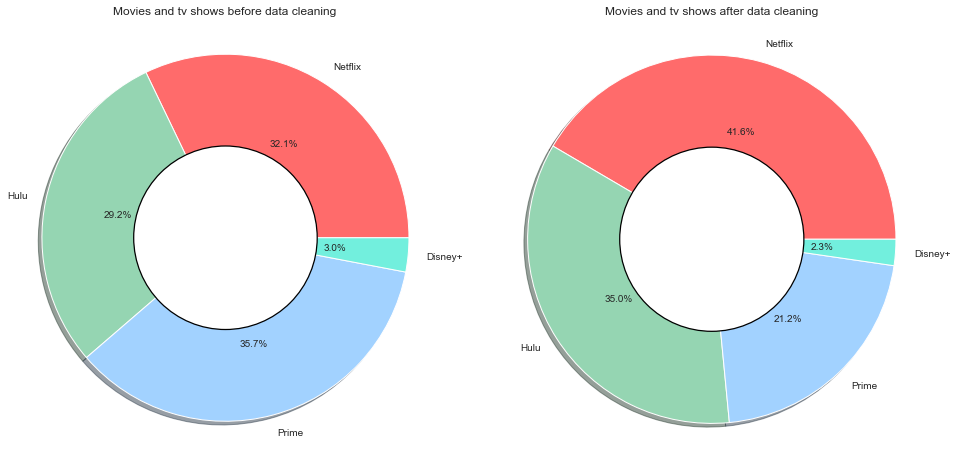

In [33]:
fig = plt.subplots(figsize=(16, 8))
labels = 'Netflix', 'Hulu','Prime','Disney+'
sizes1 = [val_counts[0], val_counts[1],val_counts[2],val_counts[3]]
sizes2 = [val_counts[4], val_counts[5],val_counts[6],val_counts[7]]
custom_colors = ["#ff6b6b","#95d5b2","#a2d2ff","#72efdd"]
colors = custom_colors
explode = (0, 0, 0, 0) 

donut(121,tvshows_df,sizes1,'Movies and tv shows before data cleaning')
donut(122,new_df,sizes2,'Movies and tv shows after data cleaning')
plt.show()

# finding min and max IMDb rating

In [34]:
#finding the minimum and maximum IMDb ratings
new_df[new_df.IMDb==new_df.IMDb.min()]

,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
732,A Little Late with Lilly Singh,2019,16+,1.7,90.0,0,1,0,0


In [35]:
new_df[new_df.IMDb==new_df.IMDb.max()]

,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
0,Breaking Bad,2008,18+,9.5,96.0,1,0,0,0


#  TV shows with the highest Rotten tomatoes rating vs availability

In [36]:
s= new_df.sort_values(by='Rotten Tomatoes', ascending=False)
s = s[0:20]
s= s[['Title','IMDb','Netflix','Hulu','Prime Video','Disney+']]
s.style.bar(subset=["Netflix",], color='#ff6b6b')\
                 .bar(subset=["Hulu"], color='#95d5b2')\
                 .bar(subset=["Prime Video"], color='#a2d2ff')\
                 .bar(subset=["Disney+"], color='#72efdd')\
                 .bar(subset=["IMDb"],color='#').background_gradient(cmap='Purples')

,Title,IMDb,Netflix,Hulu,Prime Video,Disney+
88,Fauda,8.300000,1,0,0,0
384,Final Fantasy XIV: Dad of Light,7.200000,1,0,0,0
456,Black Books,8.500000,0,1,1,0
503,Inside No. 9,8.500000,0,1,0,0
91,Big Mouth,8.000000,1,0,0,0
213,Voltron: Legendary Defender,8.100000,1,0,0,0
464,Steins;Gate,8.800000,0,1,0,0
671,Spy,7.900000,0,1,0,0
727,Sherman's Showcase,5.400000,0,1,0,0
185,Soul Eater,7.800000,1,1,0,0


#  TV shows with the highest IMDb rating vs availability

In [37]:
a= new_df.sort_values(by='IMDb', ascending=False)
a = a[0:20]
a= a[['Title','IMDb','Netflix','Hulu','Prime Video','Disney+']]
a.style.bar(subset=["Netflix",], color='#ff6b6b')\
                 .bar(subset=["Hulu"], color='#95d5b2')\
                 .bar(subset=["Prime Video"], color='#a2d2ff')\
                 .bar(subset=["Disney+"], color='#72efdd')\
                 .bar(subset=["IMDb"],color='#').background_gradient(cmap='Purples')

,Title,IMDb,Netflix,Hulu,Prime Video,Disney+
0,Breaking Bad,9.500000,1,0,0,0
738,Band of Brothers,9.400000,0,0,1,0
90,Our Planet,9.300000,1,0,0,0
737,The Wire,9.300000,0,0,1,0
416,Rick and Morty,9.200000,0,1,0,0
739,The Sopranos,9.200000,0,0,1,0
9,Avatar: The Last Airbender,9.200000,1,0,0,0
15,Fullmetal Alchemist: Brotherhood,9.100000,1,1,0,0
3,Sherlock,9.100000,1,0,0,0
815,The Planets,9.100000,0,0,1,0


#  CORRELATION ANALYSIS

In [38]:
#IMDb rating using coorelation analysis (min and max without outliers)
IMDb_rating=np.array(new_df.IMDb)
imdb_iqr=np.percentile(IMDb_rating,75)-np.percentile(IMDb_rating,25)
min_IMDb_no_outliers=max(np.percentile(IMDb_rating,25)-1.5*imdb_iqr,IMDb_rating.min())
max_IMDb_no_outliers=min(np.percentile(IMDb_rating,75)+1.5*imdb_iqr,IMDb_rating.max())
print("Minimum IMDb rating without outliers is ",min_IMDb_no_outliers)
print("Maximum IMDb rating without outliers is ",max_IMDb_no_outliers)

Minimum IMDb rating without outliers is  5.45
Maximum IMDb rating without outliers is  9.5


In [39]:
#Rotten tomatoes rating using correlation comparison (min and max without outliers)
RT_rating=np.array(new_df['Rotten Tomatoes'])
rt_iqr=np.percentile(RT_rating,75)-np.percentile(RT_rating,25)
min_RT_no_outliers=max(np.percentile(RT_rating,25)-1.5*rt_iqr,RT_rating.min())
max_RT_no_outliers=min(np.percentile(RT_rating,75)+1.5*rt_iqr,RT_rating.max())
print("Minimum Rotten Tomatoes rating without outliers is ",min_RT_no_outliers)
print("Maximum Rotten Tomatoes rating without outliers is ",max_RT_no_outliers)

Minimum Rotten Tomatoes rating without outliers is  28.0
Maximum Rotten Tomatoes rating without outliers is  100.0


In [40]:
new_df.corr()

,Year,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
Year,1.000000,-0.233711,-0.063455,0.183902,-0.216642,-0.204441,-0.016520
IMDb,-0.233711,1.000000,0.481183,0.008906,-0.005082,0.082427,-0.019638
Rotten Tomatoes,-0.063455,0.481183,1.000000,0.021997,0.017935,-0.016312,0.026189
Netflix,0.183902,0.008906,0.021997,1.000000,-0.568219,-0.405600,-0.143042
Hulu,-0.216642,-0.005082,0.017935,-0.568219,1.000000,-0.252236,-0.080669
Prime Video,-0.204441,0.082427,-0.016312,-0.405600,-0.252236,1.000000,-0.086422
Disney+,-0.016520,-0.019638,0.026189,-0.143042,-0.080669,-0.086422,1.000000


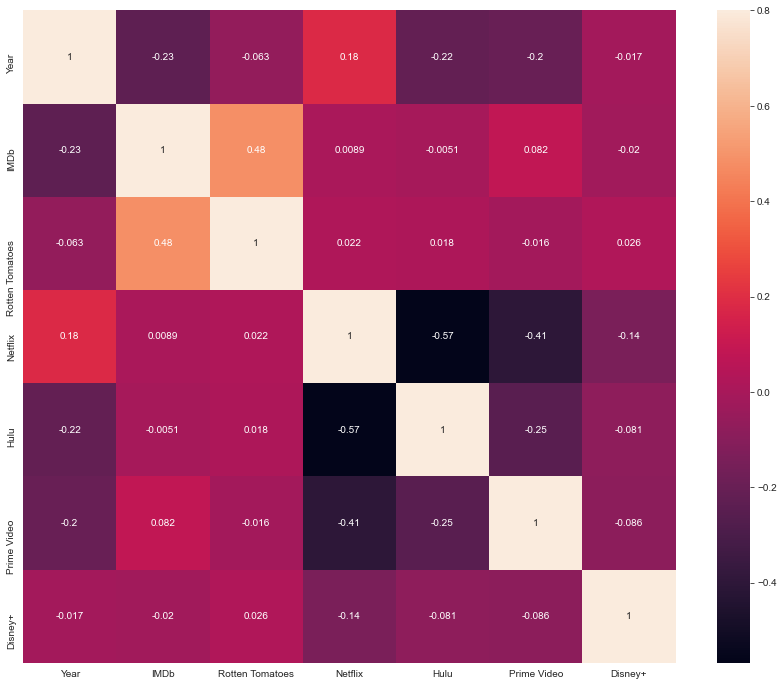

In [41]:
#Correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt
corrmat = new_df.corr()
fig = plt.figure(figsize = (15, 12))
sns.heatmap(corrmat, vmax = .8, square = True, annot = True)
plt.show()

#  removing the outliers

In [42]:
#removing the outliers
subset_df=new_df[['IMDb','Rotten Tomatoes']]
subset_df=subset_df[subset_df.IMDb>=min_IMDb_no_outliers]
subset_df=subset_df[subset_df.IMDb<=max_IMDb_no_outliers]
subset_df=subset_df[subset_df['Rotten Tomatoes']>=min_RT_no_outliers]
subset_df=subset_df[subset_df['Rotten Tomatoes']<=max_RT_no_outliers]
subset_df

,IMDb,Rotten Tomatoes
0,9.5,96.0
1,8.8,93.0
2,8.4,91.0
3,9.1,78.0
4,8.7,97.0
...,...,...
926,5.5,100.0
927,7.4,68.0
928,6.5,50.0
929,6.1,50.0


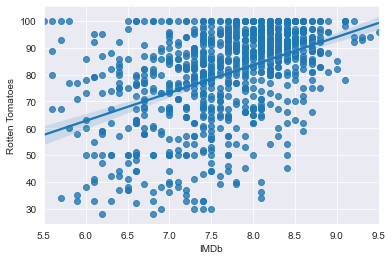

In [43]:
#plotting graph for the  without outliers
sns.regplot(x="IMDb", y="Rotten Tomatoes", data=subset_df);

In [44]:
subset_df.corr()

,IMDb,Rotten Tomatoes
IMDb,1.000000,0.448523
Rotten Tomatoes,0.448523,1.000000


In [45]:
# top 10 imdb movies and shows
topimdb=new_df.sort_values(by=['IMDb'], ascending=False)
top10imdb=topimdb.head(10)
top10imdb

,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+
0,Breaking Bad,2008,18+,9.5,96.0,1,0,0,0
738,Band of Brothers,2001,18+,9.4,94.0,0,0,1,0
90,Our Planet,2019,7+,9.3,93.0,1,0,0,0
737,The Wire,2002,18+,9.3,94.0,0,0,1,0
416,Rick and Morty,2013,18+,9.2,94.0,0,1,0,0
739,The Sopranos,1999,18+,9.2,92.0,0,0,1,0
9,Avatar: The Last Airbender,2005,7+,9.2,100.0,1,0,0,0
15,Fullmetal Alchemist: Brotherhood,2009,18+,9.1,100.0,1,1,0,0
3,Sherlock,2010,16+,9.1,78.0,1,0,0,0
815,The Planets,2019,all,9.1,100.0,0,0,1,0


In [46]:
import plotly.express as px
fig = px.bar(top10imdb, y="IMDb", x="Title", color='IMDb')
fig.show()

#  ANALYSIS AND VISUALIZATION ON THE MISSING DATA

In [47]:
import pandas as pd
import numpy as np

import missingno as msno

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import warnings 
warnings.filterwarnings('ignore')

%matplotlib inline

In [48]:
df=pd.read_csv("tv_shows.csv")
df.head()

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,9.5,96%,1,0,0,0,1
1,1,Stranger Things,2016,16+,8.8,93%,1,0,0,0,1
2,2,Money Heist,2017,18+,8.4,91%,1,0,0,0,1
3,3,Sherlock,2010,16+,9.1,78%,1,0,0,0,1
4,4,Better Call Saul,2015,18+,8.7,97%,1,0,0,0,1


<AxesSubplot:>

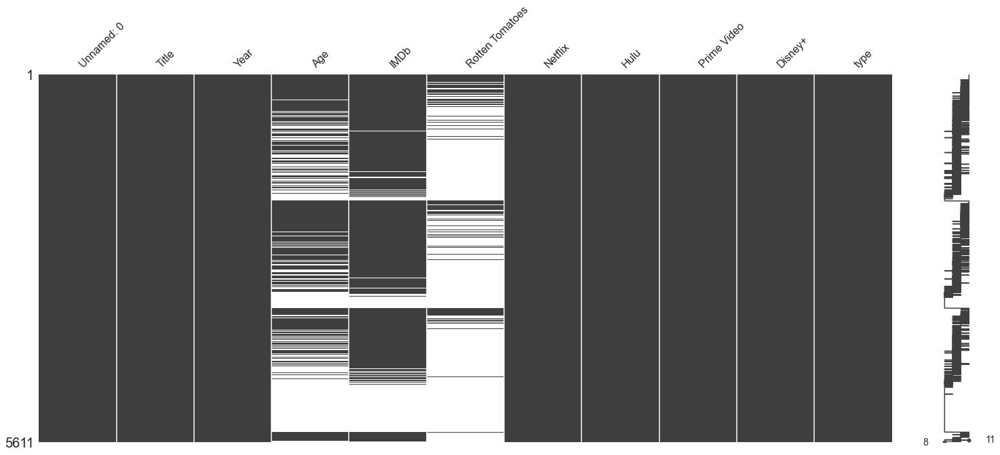

In [49]:
# Visualize missing values as a matrix
msno.matrix(df)

<AxesSubplot:>

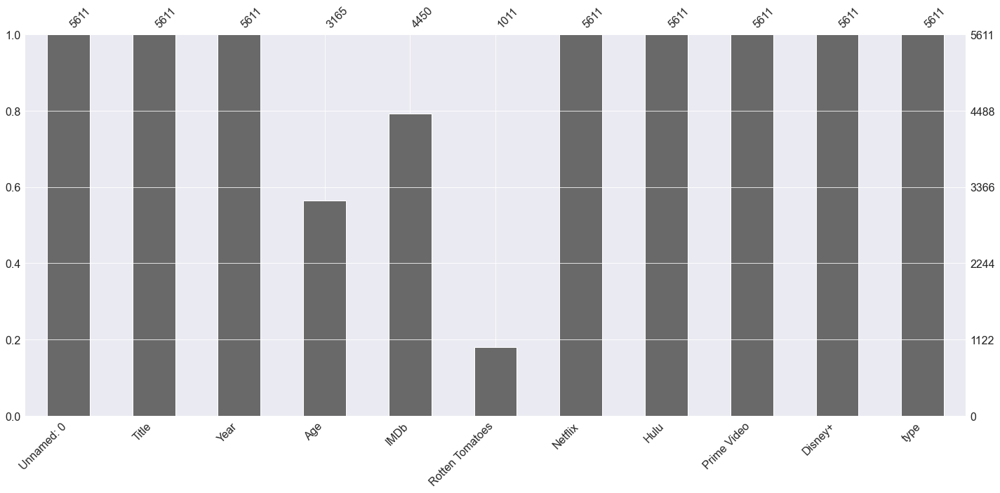

In [50]:
msno.bar(df)

In [51]:
for i in df.columns:
    null_rate = df[i].isnull().sum() / len(df)*100
    if null_rate > 0 :
        print( "{}'s null rate: {}%".format(i, round(null_rate, 2)))

Age's null rate: 43.59%
IMDb's null rate: 20.69%
Rotten Tomatoes's null rate: 81.98%


# WORDCLOUD

In [52]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud
from collections import Counter
from itertools import compress

In [53]:
df_series_ott = pd.read_csv('tv_shows.csv')
df_series_ott.drop(['Unnamed: 0'], axis=1, inplace=True)
df_series_ott.rename(columns={'type': 'Type'}, inplace=True)
df_series_ott.columns

Index(['Title', 'Year', 'Age', 'IMDb', 'Rotten Tomatoes', 'Netflix', 'Hulu',
       'Prime Video', 'Disney+', 'Type'],
      dtype='object')

In [54]:
import pandas as pd
df=pd.read_csv('tv_shows.csv')
df

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,9.5,96%,1,0,0,0,1
1,1,Stranger Things,2016,16+,8.8,93%,1,0,0,0,1
2,2,Money Heist,2017,18+,8.4,91%,1,0,0,0,1
3,3,Sherlock,2010,16+,9.1,78%,1,0,0,0,1
4,4,Better Call Saul,2015,18+,8.7,97%,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
5606,5606,Tut's Treasures: Hidden Secrets,2018,NaN,NaN,NaN,0,0,0,1,1
5607,5607,Paradise Islands,2017,NaN,NaN,NaN,0,0,0,1,1
5608,5608,Wild Russia,2018,NaN,NaN,NaN,0,0,0,1,1
5609,5609,Love & Vets,2017,NaN,NaN,NaN,0,0,0,1,1


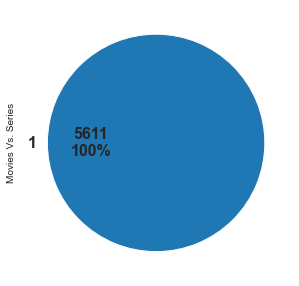

In [55]:
def label_function(val):
    return f'{val / 100 * len(df):.0f}\n{val:.0f}%'

plt.figure(figsize=(12,5))
df.groupby('type').size().plot(kind='pie', autopct=label_function,
                                textprops={'fontsize': 16, 'fontweight':'bold'})
plt.ylabel('Movies Vs. Series')
plt.show()

In [56]:
def col_2_str(data: pd.DataFrame, col_name: str, sep=',', collocations=False) -> str:
    text = ''
    col = data.dropna(subset=[col_name])[col_name].to_list()
    for elem in col:
        if collocations:
            elem = elem.replace(' ', '_')
        text += elem.replace(sep, ' ')
        text+= ' '
    return text

wc_color = lambda *args,**kwargs: 'black'

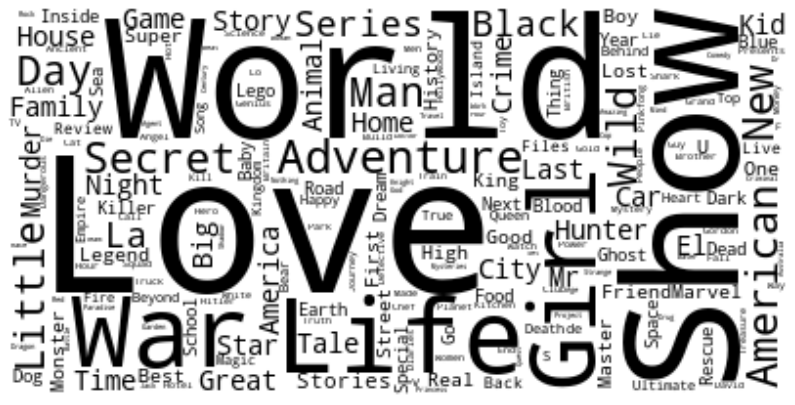

In [57]:
genres_text = col_2_str(df, 'Title').replace('-', '')
wc = WordCloud(collocations=False, background_color='white', color_func=wc_color).generate(genres_text)
plt.figure(figsize=(14,8));
plt.imshow(wc, interpolation='bilinear');
plt.axis("off");

#  Generating Report

In [66]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.


In [67]:
import pandas as pd
import numpy as np
tvshows_df = pd.read_csv('tv_shows.csv')
tvshows_df

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,9.5,96%,1,0,0,0,1
1,1,Stranger Things,2016,16+,8.8,93%,1,0,0,0,1
2,2,Money Heist,2017,18+,8.4,91%,1,0,0,0,1
3,3,Sherlock,2010,16+,9.1,78%,1,0,0,0,1
4,4,Better Call Saul,2015,18+,8.7,97%,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
5606,5606,Tut's Treasures: Hidden Secrets,2018,NaN,NaN,NaN,0,0,0,1,1
5607,5607,Paradise Islands,2017,NaN,NaN,NaN,0,0,0,1,1
5608,5608,Wild Russia,2018,NaN,NaN,NaN,0,0,0,1,1
5609,5609,Love & Vets,2017,NaN,NaN,NaN,0,0,0,1,1


In [68]:
# generating report
import pandas_profiling
pandas_profiling.ProfileReport(tvshows_df)

Summarize dataset:   0%|          | 0/24 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# FEATURE SCALING

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import warnings
import collections
warnings.filterwarnings("ignore")
import plotly
import plotly.express as px
from plotly.subplots import make_subplots

In [70]:
pip install ggplot

Note: you may need to restart the kernel to use updated packages.


In [71]:
import os
import pandas as pd
tv_shows = pd.read_csv('tv_shows.csv')
tv_shows

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,9.5,96%,1,0,0,0,1
1,1,Stranger Things,2016,16+,8.8,93%,1,0,0,0,1
2,2,Money Heist,2017,18+,8.4,91%,1,0,0,0,1
3,3,Sherlock,2010,16+,9.1,78%,1,0,0,0,1
4,4,Better Call Saul,2015,18+,8.7,97%,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
5606,5606,Tut's Treasures: Hidden Secrets,2018,NaN,NaN,NaN,0,0,0,1,1
5607,5607,Paradise Islands,2017,NaN,NaN,NaN,0,0,0,1,1
5608,5608,Wild Russia,2018,NaN,NaN,NaN,0,0,0,1,1
5609,5609,Love & Vets,2017,NaN,NaN,NaN,0,0,0,1,1


In [72]:
tv_shows.drop_duplicates(subset='Title',keep='first',inplace=True)

In [73]:
tv_shows['Rotten Tomatoes'] = tv_shows['Rotten Tomatoes'].fillna('0%')
tv_shows['Rotten Tomatoes'] = tv_shows['Rotten Tomatoes'].apply(lambda x : x.rstrip('%'))
tv_shows['Rotten Tomatoes'] = pd.to_numeric(tv_shows['Rotten Tomatoes'])

tv_shows['IMDb'] = tv_shows['IMDb'].fillna(0)
tv_shows['IMDb'] = tv_shows['IMDb']*10
tv_shows['IMDb'] = tv_shows['IMDb'].astype('int')

In [74]:
tv_shows['IMDb'].head()

0    95
1    88
2    84
3    91
4    87
Name: IMDb, dtype: int32

In [75]:
tv_shows['Rotten Tomatoes'].head()

0    96
1    93
2    91
3    78
4    97
Name: Rotten Tomatoes, dtype: int64

# wide to long form conversion 

In [76]:
tv_shows_long=pd.melt(tv_shows[['Title','Netflix','Hulu','Disney+','Prime Video']],id_vars=['Title'],var_name='StreamingOn', value_name='Present')
tv_shows_long = tv_shows_long[tv_shows_long['Present'] == 1]
tv_shows_long.drop(columns=['Present'],inplace=True)

In [77]:
tv_shows.head()

,Unnamed: 0,Title,Year,Age,IMDb,Rotten Tomatoes,Netflix,Hulu,Prime Video,Disney+,type
0,0,Breaking Bad,2008,18+,95,96,1,0,0,0,1
1,1,Stranger Things,2016,16+,88,93,1,0,0,0,1
2,2,Money Heist,2017,18+,84,91,1,0,0,0,1
3,3,Sherlock,2010,16+,91,78,1,0,0,0,1
4,4,Better Call Saul,2015,18+,87,97,1,0,0,0,1


In [78]:
tv_shows_merged = tv_shows_long.merge(tv_shows, on='Title', how='inner')
tv_shows_merged.drop(columns = ['Unnamed: 0','Netflix','Hulu', 'Prime Video', 'Disney+', 'type'], inplace=True,axis = 1)
tv_shows_merged.head()

,Title,StreamingOn,Year,Age,IMDb,Rotten Tomatoes
0,Breaking Bad,Netflix,2008,18+,95,96
1,Stranger Things,Netflix,2016,16+,88,93
2,Money Heist,Netflix,2017,18+,84,91
3,Sherlock,Netflix,2010,16+,91,78
4,Better Call Saul,Netflix,2015,18+,87,97


<AxesSubplot:xlabel='StreamingOn'>

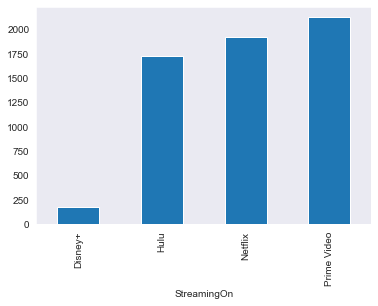

In [79]:
tv_shows_merged.groupby('StreamingOn').Title.count().plot(kind='bar')\

In [80]:
import plotly.express as px
tv_shows_ratings = tv_shows_merged[(tv_shows_merged.IMDb > 0) & tv_shows_merged['Rotten Tomatoes'] > 0]
px.scatter(tv_shows_ratings, x='IMDb',y='Rotten Tomatoes',color='StreamingOn')

<AxesSubplot:>

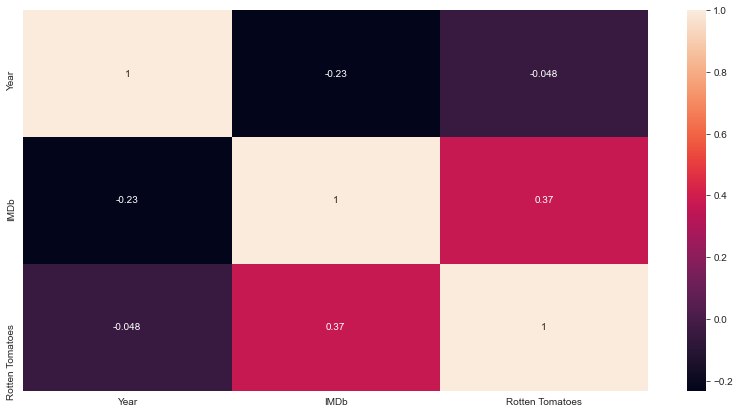

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import warnings
import collections
warnings.filterwarnings("ignore")
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import warnings
import collections
warnings.filterwarnings("ignore")
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
corr = tv_shows_ratings.corr(method='kendall')
plt.figure(figsize=(14,7))
sns.heatmap(corr, annot=True)

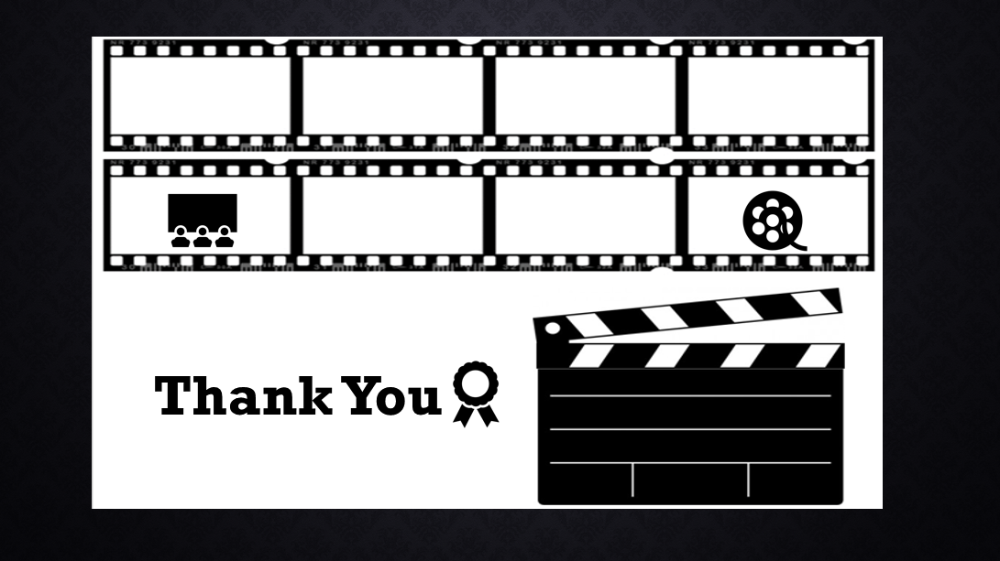